<a href="https://colab.research.google.com/github/machadoDaniels/Digital-Signal-and-Image-Processing/blob/main/A01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Autores:

- Daniel Machado Pedrozo
- Fernando de Assis Mota
- Gabriel Macedo Bontempo

# INF0413 - Processamento Digital de Sinais e Imagens

A01 - Primeira avaliação da aprendizagem


## Introdução

O processamento de áudio desempenha um papel fundamental na área da Inteligência Artificial, possibilitando uma variedade de aplicações essenciais em nosso mundo digital. A capacidade de extrair informações significativas a partir de sinais sonoros não apenas amplia nosso entendimento do ambiente, mas também oferece inúmeras oportunidades para melhorar a qualidade de vida e explorar novos horizontes tecnológicos.

Hoje iremos investigar uma aplicação interessante desta área de conhecimento para o esporte, o **pulo de corda**, uma atividade física que combina diversão e saúde. Neste desafio, vamos explorar como o processamento de áudio pode auxiliar na forma como atletas praticam este esporte.

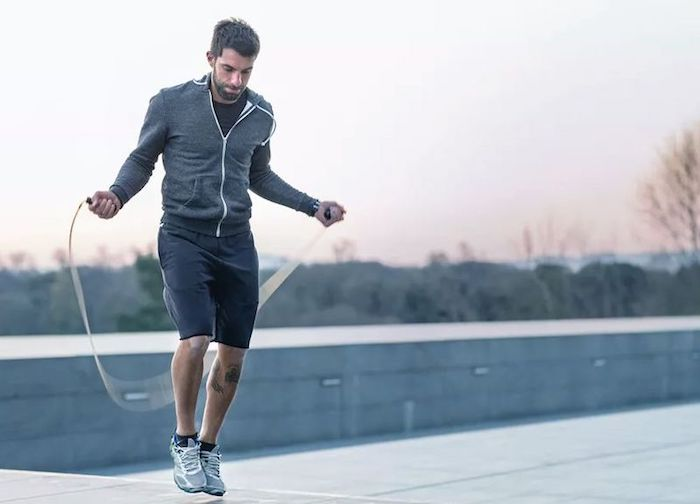

## O desafio
Um contador automático de pulos de corda seria de muita utilidade para os entusiastas deste esporte, tornando suas experiências mais envolventes e produtivas. Além de eliminar a margem de erro associada à contagem manual, ele ofereceria um acompanhamento preciso do desempenho, permitindo que os praticantes ajustem suas rotinas de treinamento com base em dados confiáveis. Isso não apenas melhora a eficácia dos exercícios, mas também pode servir como uma ferramenta motivacional, permitindo que os atletas estabeleçam metas e meçam seu progresso de forma consistente. Em competições, o contador automático garante uma avaliação justa e imparcial, nivelando o campo de jogo para todos os participantes.

Nesta prova, nosso objetivo será criar um detector de pulo de corda e não um contador. O foco será desenvolver um modelo que, dado um determinado áudio, determine se alguém está pulando corda ou não. Isso é um passo fundamental, pois antes de realizar a contagem automatizada, é essencial identificar a presença do movimento de pulo de corda. Este desafio marca o início do processo, preparando o caminho para a automatização completa da contagem.




## Os dados

Os dados foram coletados pelo Lucca. São disponibilizadas três gravações nas quais são realizados saltos de corda a diferentes distâncias dos fones de gravação. Os dados não passaram por nenhum processamento específico, no entanto, foram editados de forma a garantir que cada áudio tenha um tamanho fixo de 1 milhão de amostras, com uma frequência de amostragem de 48000, resultando em uma duração de 20.8 segundos. Além disso, os áudios foram segmentados de modo que a primeira metade não contenha a prática de pular corda, enquanto na segunda metade os saltos sejam efetivamente exeutados. Para resumir:

- 3 áudios
- 1 milhão de tamanho
- 48000 de frequência de amostragem
- 20.8 segundos de audio
- Primeira metade não estou pulando, segunda metade estou pulando

In [ ]:
48000 * 20.8

998400.0

In [ ]:
# Baixar o dataset
!gdown 1-BfjhuHYpFXYZDkvD81aoahNkn2VJjve # sinal x1
!gdown 1-ETBKzy9_ZgkH2_jX9e2-e1vaiaQwiCf # sinal x2
!gdown 1-FFx3jox6GGNyU0qb8vwk_ztSKW67nK1 # sinal x3
!gdown 185wKkiCKNBDN4BxBAqmXVYr0OD59E4JQ # myAudioProcessing

Downloading...
From: https://drive.google.com/uc?id=1-BfjhuHYpFXYZDkvD81aoahNkn2VJjve
To: /content/x1.npz
100% 8.00M/8.00M [00:00<00:00, 99.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-ETBKzy9_ZgkH2_jX9e2-e1vaiaQwiCf
To: /content/x2.npz
100% 8.00M/8.00M [00:00<00:00, 79.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-FFx3jox6GGNyU0qb8vwk_ztSKW67nK1
To: /content/x3.npz
100% 8.00M/8.00M [00:00<00:00, 196MB/s]
Downloading...
From: https://drive.google.com/uc?id=185wKkiCKNBDN4BxBAqmXVYr0OD59E4JQ
To: /content/myAudioProcessingLib.py
100% 1.22k/1.22k [00:00<00:00, 2.77MB/s]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('/content/')
from myAudioProcessingLib import *

# Iremos importar os dados como numpy arrays
x1 = np.load('/content/x1.npz')['arr_0']
x2 = np.load('/content/x2.npz')['arr_0']
x3 = np.load('/content/x3.npz')['arr_0']

# fs é nossa frequência de amostragem
# Neste caso, coletamos 48000 amostras por segundo
fs = 48000

## Visualizando os dados

Vamos dar início a nossa exploração de dados!

Mas antes, vamos criar uma função que será útil para visualização dos plots.

In [ ]:
def plot_2_figures(figure1, figure2, **kwargs):
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2)

    # Plot the first figure in the first subplot
    ax1.plot(figure1)
    ax1.set_title(kwargs.get('title1', 'Subplot 1'))
    ax1.set_xlabel(kwargs.get('xlegend1', 'X-axis'))
    ax1.set_ylabel(kwargs.get('ylegend1', 'Y-axis'))

    # Plot the second figure in the second subplot
    ax2.plot(figure2)
    ax2.set_title(kwargs.get('title2', 'Subplot 2'))
    ax2.set_xlabel(kwargs.get('xlegend2', 'X-axis'))
    ax2.set_ylabel(kwargs.get('ylegend2', 'Y-axis'))

    # Display the plot
    plt.show()

Além disso, vamos definir uns parametros para que os plots fiquem mais bonitos e personalizados.

In [ ]:
'''
Este código só define algumas características dos plots que iremos fazer
para ficar mais bonito e com o código mais limpo
'''
from warnings import simplefilter

simplefilter('ignore')

# Set Matplotlib defaults
plt.style.use('seaborn-whitegrid')
plt.rc('figure', autolayout=True, figsize=(12, 4))
plt.rc(
    'axes',
    labelweight='bold',
    labelsize='large',
    titleweight='bold',
    titlesize=16,
    titlepad=10,
)

%config InlineBackend.figure_format = 'retina'

Aqui um exemplo de como usar a função:

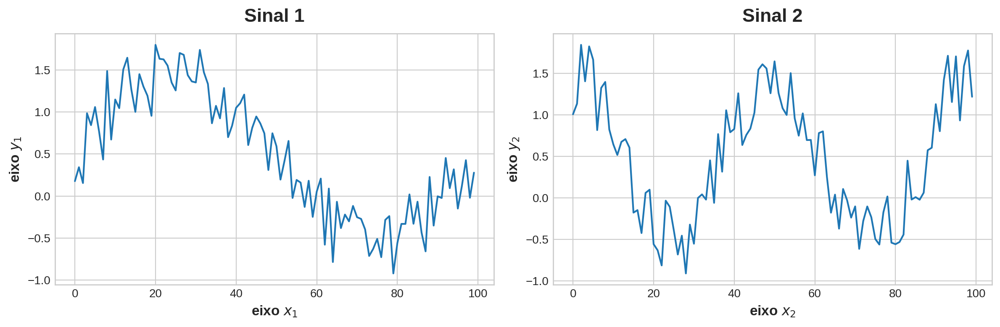

In [ ]:
N = 100 # amostras
n = np.linspace(0, 2*np.pi, N)

sinal1 = np.sin(n) + np.random.random(N)
sinal2 = np.cos(2*n) + np.random.random(N)

kwargs = {
    'title1': 'Sinal 1',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Sinal 2',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)


Vamos "ver" como é a cara de nossos áudios?

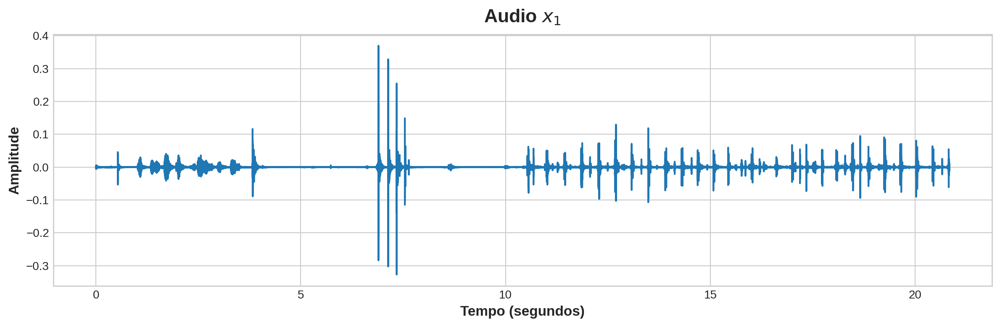

In [ ]:
# Criando o vetor de tempo
N1 = len(x1)
n = np.arange(N1)
t = n / fs

# Plotagem do sinal de audio
plt.plot(t, x1)
plt.title(r'Audio $x_1$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

Como você pode ver, da metade para a frente parece que há uma ritmo bem constante.
Bom, isto é o Lucca pulando corda! Na primeira metade parece ter alguns ruidos, mas não precisamos nos preocupar (é o Lucca fazendo uns barulhos aleatórios para não ficar num silêncio rsrsrs).

Podemos também ouvir os áudios para entender ainda mais o contexto dos dados recebidos.

In [ ]:
play(x1, fs)

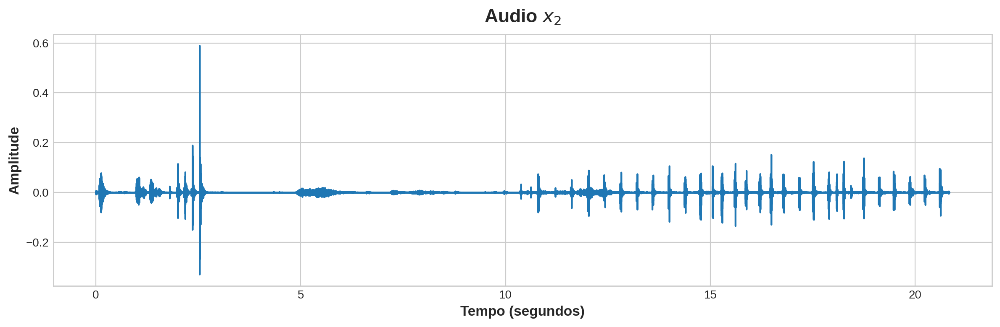

In [ ]:
# Criando o vetor de tempo
N2 = len(x2)
n2 = np.arange(N2)
t2 = n2/ fs

# Plotagem do sinal de audio
plt.plot(t2, x2)
plt.title(r'Audio $x_2$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

In [ ]:
play(x2, fs)

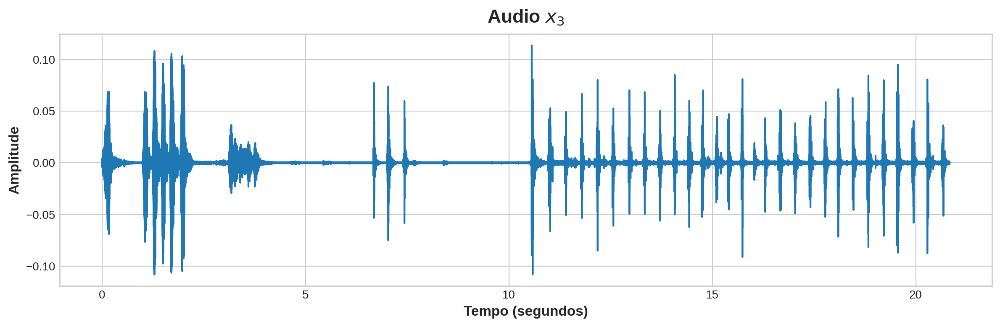

In [ ]:
# Criando o vetor de tempo
N3 = len(x3)
n3 = np.arange(N3)
t3 = n3/ fs

# Plotagem do sinal de audio
plt.plot(t3, x3)
plt.title(r'Audio $x_3$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

In [ ]:
play(x3, fs)


 Janelas de 2000 amostras


In [ ]:
def janela(vetor, init, fim):
  return vetor[init:fim]

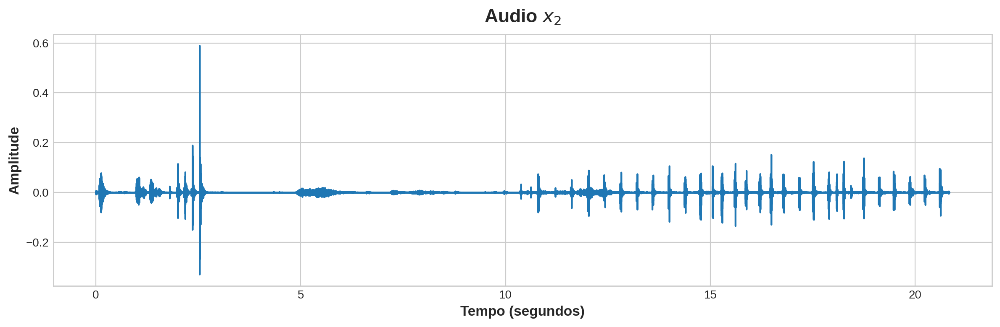

In [ ]:
# Criando o vetor de tempo
N2 = len(x2)
n2 = np.arange(N2)
t2 = n2/ fs

# Plotagem do sinal de audio
plt.plot(t2, x2)
plt.title(r'Audio $x_2$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

In [ ]:
def plot_janela(vetor, init, fim):
  # Criando o vetor de tempo
  vet = janela(vetor, init, fim)
  N = len(vet)
  n = np.arange(N)
  t = n / fs

  # Plotagem do sinal de audio
  plt.plot(t, vet)
  plt.title(r'Audio $x_3$')
  plt.xlabel('Tempo (segundos)')
  plt.ylabel('Amplitude')
  plt.show()


#### *Desafio 1: (1 ponto)*
- Plote as ondas de som numa pequena janela de tempo, numa espécie de *zoom* para melhor visualizar elas.
- Experimente com tamanhos de janela diferentes.

*Dica*: Defina como parâmetros uma posição inicial no áudio original e um tamanho de janela.

In [ ]:
def plot_janela(vetor, init=None, tam=0):
  # Criando o vetor de tempo
  tam_vet_origi = len(vetor)

  vet = janela(vetor, init, tam)
  N = len(vet)
  n = np.arange(N)
  t = (n + (init)) / fs

  # Plotagem do sinal de audio
  plt.plot(t, vet)
  plt.title(r'Audio')
  plt.xlabel('Tempo (segundos)')
  plt.ylabel('Amplitude')
  plt.show()

def janela(vetor, init=None, tam=0):
  fim = init + tam
  return vetor[init:fim]


> Janela do audio x1 a partir da amostra, a partir do segundo 8, aproximadamente, com 200 mil amostras

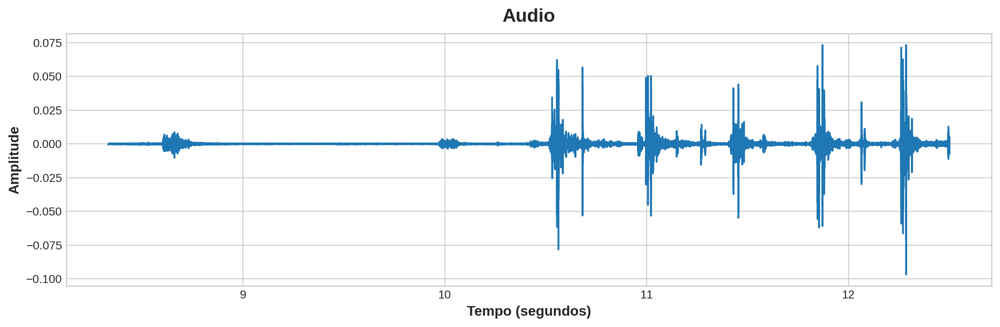

In [ ]:
plot_janela(x1, int(len(x1)/2) - 100000, 200000)

> Janela do audio x1 a partir das últimas 100 mil amostras até o final.

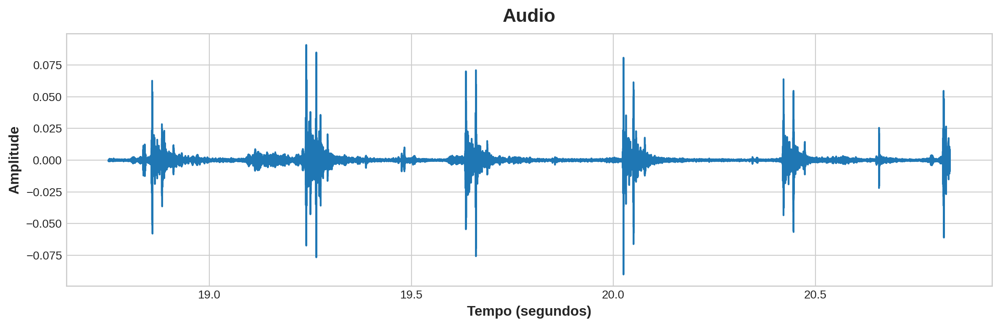

In [ ]:
plot_janela(x1, int(len(x1))-100000, 100000)

> Janela do audio x3 a partir do início, mostrando 2 mil amostras.

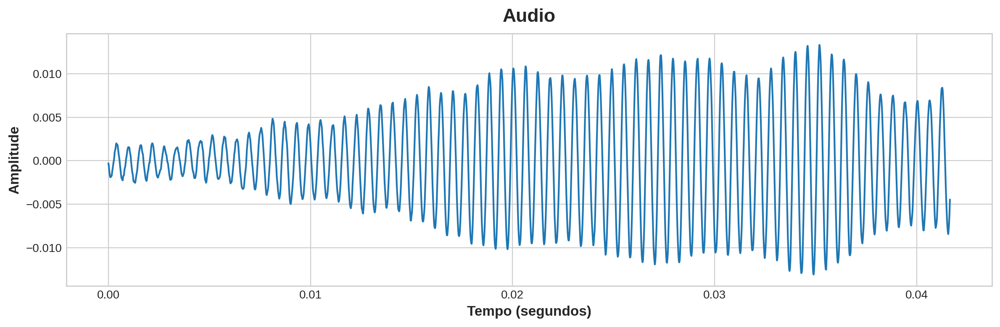

In [ ]:
plot_janela(x3, 0, 2000)

> Janela do audio x2 a partir da amostra 900000, com 1 mil amostras

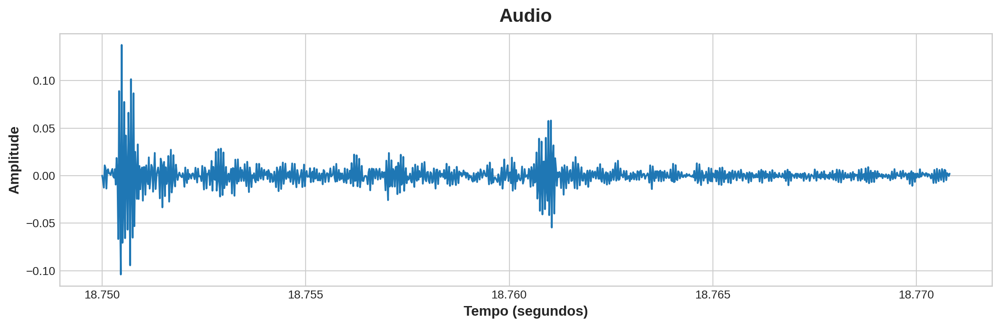

In [ ]:
plot_janela(x2, 900000, 1000)

> Janela do audio x1 a partir da amostra 400000, com 200000 mil amostras

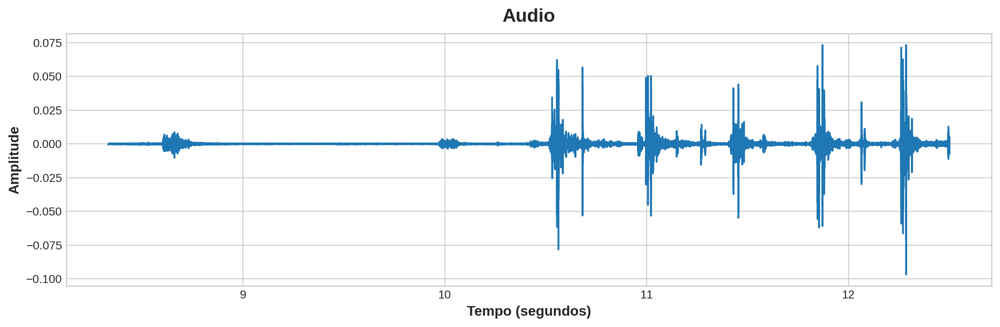

In [ ]:
plot_janela(x1, 400000, 200000)

## Análise exploratória

Nesta sessão, vamos investigar um pouco como uma pequena janela de tempo comporta no domínio do tempo comparado com o domínio da frequência. Mas antes disso, vamos analisar as ondas de som no áudio original.


### Domínio do Tempo VS Domínio da Frequência

O eixo $x$ da imagem que você plotou representa o tempo.
Porém, como vimos nas aulas, este não é o único modo de representar um sinal.
Ao invés de mostrar a intensidade do áudio ao longo do tempo, podemos mostrar as frequências que compoem o sinal original.
Deste modo, podemos analisar melhor a informação das características periódicas presentes no áudio em análise.



#### *Desafio 2: (1 ponto)*

1. Aplique a transformada de Fourier para visualizar as primeiras 200 amostras da magnitude do espectro.
2. O que você consegue interpretar a partir do gráfico da transformada? Ela apresenta algum destaque ou informação? O que os *picos* deste gráfico indicam?


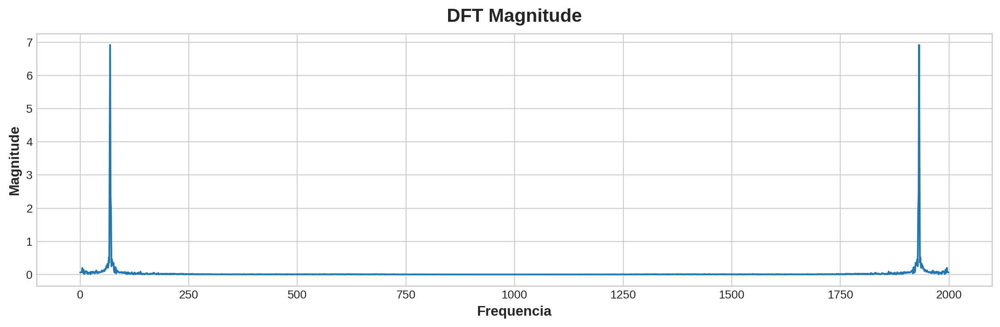

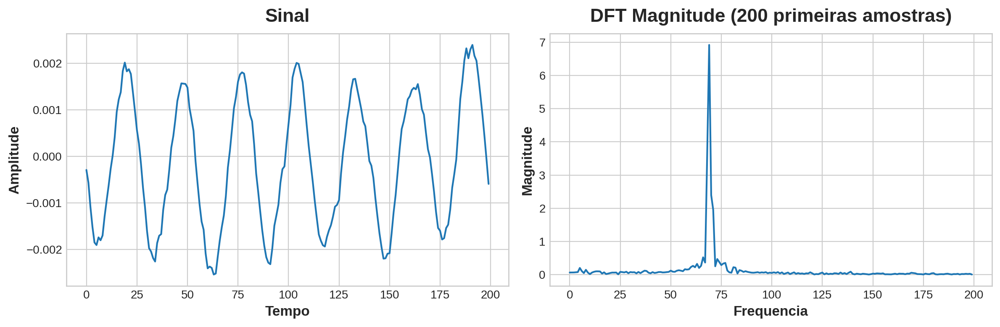

In [ ]:
data = janela(x3, 0, 2000)
data_fft = np.fft.fft(data)

magnitude = np.abs(data_fft)


plt.title('DFT Magnitude')
plt.xlabel('Frequencia')
plt.ylabel('Magnitude')
plt.plot(magnitude)
plt.show()

kwargs = {
    'title1': 'Sinal',
    'xlegend1': r'Tempo',
    'ylegend1': r'Amplitude',
    'title2': 'DFT Magnitude (200 primeiras amostras)',
    'xlegend2': r'Frequencia',
    'ylegend2': r'Magnitude'
}


plot_2_figures(data[:200],magnitude[:200], **kwargs)

>  ***RESPOSTA DESAFIO 2.2**:

**O que você consegue interpretar a partir do gráfico da transformada? Ela apresenta algum destaque ou informação? O que os picos deste gráfico indicam?**

> -- *O gráfico da transformada indica a frequência "dominante" na janela observada, após o tratamento com FFT*

## Processamento dos dados

### Média móvel (filtro passa-baixo)

A média móvel é um **filtro de sinal** usado para suavizar dados. Ela se calcula com base na média de uma certa janela temporal (geralmente chamada de período) e movendo ou deslizando essa janela ao longo da toda uma série temporal.

O algoritmo de média móvel também é conhecido como **filtro passa-baixo** que, como o nome sugere, só deixa passar as frequências mais baixas de um sinal que, em outras palavras, equivale a eliminar o conteúdo de alta frequência!

In [ ]:
def media_movel(signal, window_size):
    weights = np.repeat(1.0, window_size) / window_size
    moving_average = np.convolve(signal, weights, mode='same')

    return moving_average


#### *Desafio 3: (1 ponto)*
  
1. Pegue uma amostra do sinal dentro de uma janela de tempo e aplique a média movel.
Usando a função `plot_2_figures`, compare os sinais original e processado.
Experimente com tamanhos de janela diferentes.
2. Aplique a transformada de Fourier no sinal processado. Faça um gráfico comparando a magnitude dos espectros dos sinais original e processado.
3. Analisando ambos espectros, o que você consegue observar? Os sinais são parecidos? Por que?

*Dica*: Use uma janela de tamanho $2048$ na posição $3000$ do primeiro sinal $x_1$ para visualizar melhor o efeito da filtragem por média móvel (é apenas uma sugestão, você pode utilizar uma outra janela)

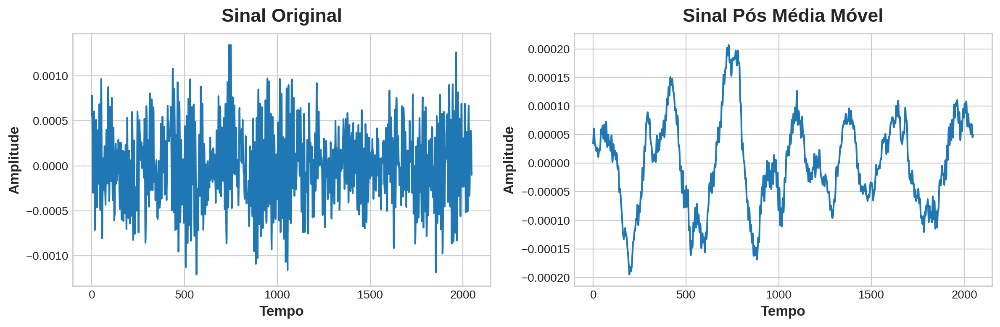

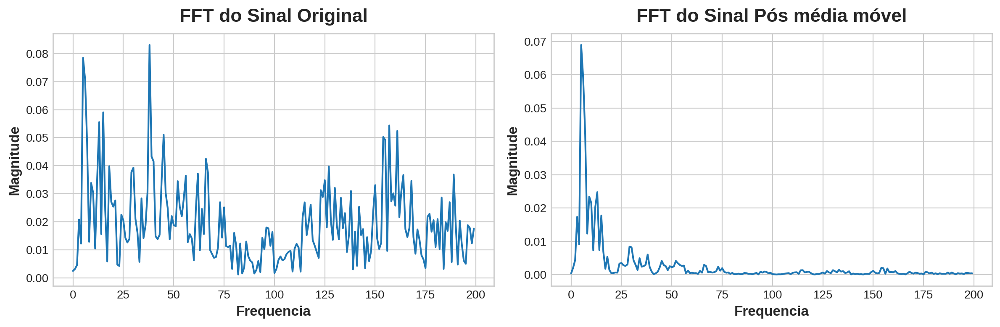

In [ ]:
data_3 = janela(x1, 3000, 2048)
data_3_fft = np.fft.fft(data_3)

magnitude_3_original = np.abs(data_3_fft)


process_data = media_movel(data_3, 100)
process_data_fft = np.fft.fft(process_data)

magnitude_3_process = np.abs(process_data_fft)

kwargs = {
    'title1': 'Sinal Original',
    'xlegend1': r'Tempo',
    'ylegend1': r'Amplitude',
    'title2': 'Sinal Pós Média Móvel',
    'xlegend2': r'Tempo',
    'ylegend2': r'Amplitude'
}
plot_2_figures(data_3, process_data, **kwargs)

kwargs = {
    'title1': 'FFT do Sinal Original',
    'xlegend1': r'Frequencia',
    'ylegend1': r'Magnitude',
    'title2': 'FFT do Sinal Pós média móvel',
    'xlegend2': r'Frequencia',
    'ylegend2': r'Magnitude'
}
plot_2_figures(magnitude_3_original[:200], magnitude_3_process[:200], **kwargs)

>  **RESPOSTA DESAFIO 3.3**:
Analisando ambos espectros, o que você consegue observar? Os sinais são parecidos? Por que?

> -- *Comparando o sinal original com o processado pós média móvel, temos 2 sinais parecidos, entretanto o sinal processado é mais "limpo" de ruídos.*

> *Quando comparamos a TF do sinal original VS a TF do sinal processado pós média móvel, fica nítida a redução de ruído e a predominância das frequências mais determinantes pro sinal, no trecho analisado.*

### Savitsky-Golay

O **filtro de Savitzky-Golay** é um outro algoritmo frequentemente utilizado em processamento de sinais e análise de séries temporais para suavização de dados e remoção de ruído em conjuntos de dados experimentais.
Ele funciona aplicando uma janela deslizante sobre os dados (semelhante ao filtro de média móvel), e ajustando um polinômio sobre os dados dentro da janela.
Em seguida, calcula-se o valor de suavização a partir dos coeficientes do polinômio.
Isto ajuda a reduzir ruídos presentes nos dados, preservando as características essenciais do sinal original.
A principal vantagem deste filtro é a sua capacidade de preservar as características locais da curva, tornando-o útil em aplicações que requerem suavização sem comprometer detalhes importantes.

Segue aqui um exemplo de uso do filtro.

In [ ]:
from scipy.signal import savgol_filter

# Seus dados de entrada
data = [1.2, 1.8, 2.1, 3.4, 2.8, 3.9, 4.2, 4.8]

# Especificação dos parâmetros do filtro
window_length = 5  # Tamanho da janela
polyorder = 2      # Ordem do polinômio

# Aplicando o filtro Savitzky-Golay
smoothed_data = savgol_filter(data, window_length, polyorder)


#### *Desafio 4: (1 ponto)*

1. Escolha uma janela de tempo e aplique o filtro de Savitzky-Golay.
Usando a função `plot_2_figures`, compare o sinal original da janela com o sinal processado. Teste com diferentes parâmetros do filtro.
2. No sinal processado, aplique a transformada de Fourier e faça um gráfico comparativo mostrando a magnitude do espectro dos sinais original e processado.
3. Analisando ambos espectros, o que você consegue observar? Os sinais são parecidos? Por que?

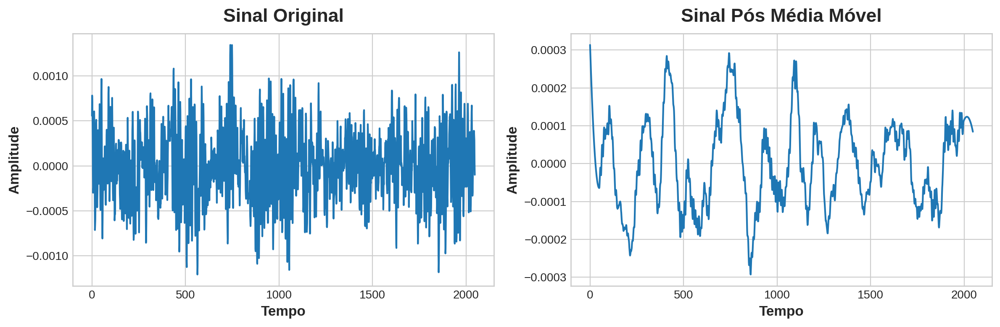

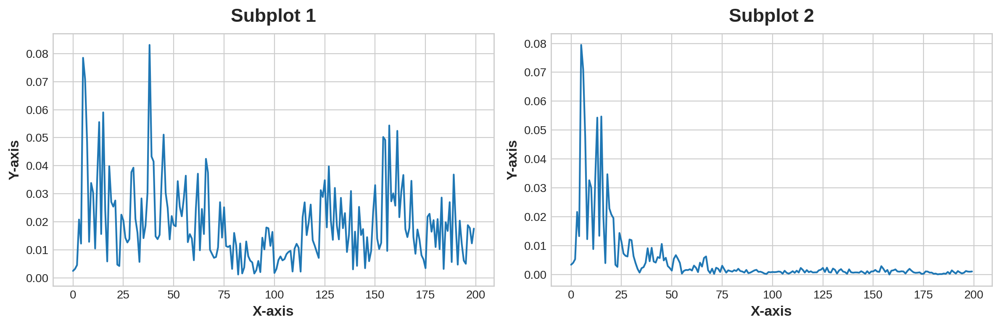

In [ ]:
# Especificação dos parâmetros do filtro
window_length = 100  # Tamanho da janela
polyorder = 2      # Ordem do polinômio

data_3SG = janela(x1, 3000, 2048)
data_3_fftSG = np.fft.fft(data_3SG)

magnitude_3_originalSG = np.abs(data_3_fftSG)

process_dataSG = savgol_filter(data_3SG, window_length, polyorder)
process_data_fftSG = np.fft.fft(process_dataSG)

magnitude_3_processSG = np.abs(process_data_fftSG)


kwargs = {
    'title1': 'Sinal Original',
    'xlegend1': r'Tempo',
    'ylegend1': r'Amplitude',
    'title2': 'Sinal Pós Média Móvel',
    'xlegend2': r'Tempo',
    'ylegend2': r'Amplitude'
}
plot_2_figures(data_3SG, process_dataSG, **kwargs)

kwargs = {
    'title1': 'FFT do Sinal Original',
    'xlegend1': r'Frequencia',
    'ylegend1': r'Magnitude',
    'title2': 'FFT do Sinal Pós média móvel',
    'xlegend2': r'Frequencia',
    'ylegend2': r'Magnitude'
}
plot_2_figures(magnitude_3_originalSG[:200], magnitude_3_processSG[:200])

>  **RESPOSTA DESAFIO 4.3**:
Analisando ambos espectros, o que você consegue observar? Os sinais são parecidos? Por que?

> -- *Comparando o sinal original com o processado por Savgol, temos 2 sinais parecidos, entretanto o sinal processado é mais "limpo" de ruídos, deixando mais evidente as frequências mais determinantes.*

> *Quando comparamos a TF do sinal original VS a TF do sinal processado com Savgol, fica nítida a redução de ruído e a predominância das frequências mais determinantes pro sinal, no trecho analisado.*

## Modelo

Agora é sua vez. Lembre-se, a nota da sua prova será igual à acurácia do seu modelo.........brincadeira 🙃.
O objetivo aqui é juntar seus conhecimentos Python em processamento de sinais para criar um modelo de classificação de áudio.

***Apenas relembrando**: O objetivo é *"para uma dada janela de tempo no áudio, podemos dizer se há alguém pulando a corda?"*

### *Desafio 5: (6 pontos)*

Utilize o que você aprendeu e aplicou neste notebook para montar um modelo de classificação de aúdio. Para isto:
1. Monte um dataset com janelas de tempo de tamanho fixo e label binária ($1$ para *"está pulando"* e $0$ para *"não está pulando"*).
Utilize os 3 arquivos de sinais recebidos. (2 pontos)
2. Processe o dataset com técnicas de sua escolha. (2 pontos)
3. Crie um modelo classificador. A definição do modelo fica ao seu critério (*e.g.*, regressão logística, rede neural, arvore de decisão, etc.) (1 ponto)
4. Avalie seu modelo em termos de Acurácia, Precisão, Recall e F1-Score. Interprete os resultados (1 ponto)

**Notas importantes:**
- Para a montagem do dataset, lembrem que há várias técnicas de amostragem de dados. Como vocês devem selecionar janelas de tempo dos áudios para criar um dataset, pensem em como coletar essas janelas. Serão janelas aleatórias? Serão janelas igualmente espaçadas? Algumas técnicas que aprendemos em estatística são amostragem simples, estratificada, sistemática e etc. (Não precisa detalhar qual método vocês vão utilizar, apenas pensem em como montar um bom dataset que represente os áudios)

- Não pegue janelas de tempo muito grandes (recomendo janelas com menos de 0.1 segundo). Caso a janela seja grande, na hora de montar o dataset pode haver muita sobreposição de dados (parte de uma janela está em outra janela do dataset) e isso pode levar em overfitting.

> Dataset

Para começar a montagem do dataset, começamos 'fatiando' a parte com pulos e a parte sem pulos em faixas de 4000 amostras

In [ ]:
dataset_x1 = []

n_amostras = 4000

num_total = int(len(x1)/n_amostras)

cut = int(num_total/2)

for i in range(num_total):
  dataset_x1.append(x1[i*n_amostras:i*n_amostras+n_amostras])

dataset_x1_0 = dataset_x1[:cut]
dataset_x1_1 = dataset_x1[cut:]

In [ ]:
dataset_x2 = []

for i in range(num_total):
  dataset_x2.append(x2[i*n_amostras:i*n_amostras+n_amostras])

dataset_x2_0 = dataset_x2[:cut]
dataset_x2_1 = dataset_x2[cut:]


In [ ]:
dataset_x3 = []

for i in range(num_total):
  dataset_x3.append(x3[i*n_amostras:i*n_amostras+n_amostras])

dataset_x3_0 = dataset_x3[:cut]
dataset_x3_1 = dataset_x3[cut:]


In [ ]:
dataset_0 = dataset_x1_0 + dataset_x2_0 + dataset_x3_0

In [ ]:
dataset_1 = dataset_x1_1 + dataset_x2_1 + dataset_x3_1

In [ ]:
dataset_0 = np.array(dataset_0)

In [ ]:
dataset_1 = np.array(dataset_1)

In [ ]:
dataset_0

array([[ 2.22973083e-03,  3.49473953e-03,  3.00600380e-03, ...,
        -3.74288531e-04, -2.62294809e-04, -3.40330909e-04],
       [-3.51706316e-04, -1.40798284e-05,  1.82157135e-04, ...,
         1.97674366e-04,  2.33093757e-04,  2.93124496e-04],
       [ 1.75649300e-04,  1.09393084e-04,  2.02317169e-04, ...,
         3.70898750e-04,  1.69374456e-04, -1.30919623e-04],
       ...,
       [-8.25416919e-06,  3.65732412e-05,  2.77679792e-05, ...,
         1.14116119e-04,  2.66288753e-05,  6.68116481e-05],
       [ 3.24348230e-06, -1.06762083e-04, -1.01777550e-04, ...,
         2.39373985e-04,  2.68877193e-04,  1.98085356e-04],
       [ 1.59325267e-04,  2.52178783e-04,  2.33475934e-04, ...,
        -3.87902619e-05, -8.00169219e-05, -2.83764035e-04]])

In [ ]:
dataset_1

array([[ 1.90564111e-04,  1.43155412e-04,  2.36280393e-04, ...,
        -3.25252535e-04, -3.02961038e-04, -5.73522520e-05],
       [ 1.44089034e-04,  1.89952538e-04,  4.02305450e-04, ...,
        -5.50859666e-04, -1.18616677e-03,  8.96516722e-04],
       [ 1.35856832e-03,  9.48430737e-04,  1.50137139e-03, ...,
        -6.45238557e-04, -7.73975044e-04, -1.68614497e-04],
       ...,
       [-2.93254619e-04, -3.54245334e-04, -4.63355682e-04, ...,
        -5.83881000e-03,  7.15849781e-03,  1.10441982e-03],
       [-6.73092296e-03, -4.63440642e-03,  1.21619375e-02, ...,
         3.07163078e-04, -2.60748056e-04, -2.69326538e-05],
       [ 2.06440847e-04, -2.46167881e-04, -4.04880411e-05, ...,
        -1.76880960e-04, -3.29539238e-04, -2.79410859e-04]])

> Preprocessing

Para pre processar, aplicaremos a transformada de fourier nos dados verdadeiros(pulando) e nos dados falsos(sem pulos)

In [ ]:
def preprocess(vet, feature_num=None):

  vet_process_fft = np.fft.fft(vet)

  magnitude_3_process = np.abs(vet_process_fft)

  return magnitude_3_process[:feature_num]

f_num = n_amostras

In [ ]:
dataset0_magnitude = np.empty((0, f_num), dtype=float)

for data in dataset_0:

  mag_data = preprocess(data, f_num)

  dataset0_magnitude = np.append(dataset0_magnitude, [mag_data], axis=0)


In [ ]:
dataset1_magnitude = np.empty((0, f_num), dtype=float)

for data in dataset_1:

  mag_data = preprocess(data, f_num)

  dataset1_magnitude = np.append(dataset1_magnitude, [mag_data], axis=0)


In [ ]:
dataset_0 == dataset_1

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
dataset0_magnitude == dataset1_magnitude

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
dataset1_magnitude

array([[0.01187695, 0.01213454, 0.01274699, ..., 0.02088781, 0.01274699,
        0.01213454],
       [0.0168453 , 0.01709261, 0.018603  , ..., 0.02064672, 0.018603  ,
        0.01709261],
       [0.00535925, 0.00531206, 0.0050801 , ..., 0.00226102, 0.0050801 ,
        0.00531206],
       ...,
       [0.01834013, 0.01872566, 0.02031224, ..., 0.0220009 , 0.02031224,
        0.01872566],
       [0.00033771, 0.00485524, 0.0110051 , ..., 0.0226058 , 0.0110051 ,
        0.00485524],
       [0.0292204 , 0.03017398, 0.03247908, ..., 0.03511952, 0.03247908,
        0.03017398]])

In [ ]:
dataset0_magnitude

array([[0.00677211, 0.00685164, 0.00738689, ..., 0.00880662, 0.00738689,
        0.00685164],
       [0.00332641, 0.00335649, 0.00339726, ..., 0.00347183, 0.00339726,
        0.00335649],
       [0.00052924, 0.00066497, 0.00116808, ..., 0.00178529, 0.00116808,
        0.00066497],
       ...,
       [0.00890042, 0.00900599, 0.0092704 , ..., 0.00979547, 0.0092704 ,
        0.00900599],
       [0.00486322, 0.00488081, 0.0049972 , ..., 0.00594741, 0.0049972 ,
        0.00488081],
       [0.00499461, 0.00498745, 0.00515049, ..., 0.00426249, 0.00515049,
        0.00498745]])

Com todas as faixas de amostras passadas pelo preprocessamento, criamos o X, concatenando o dataset sem pulos + dataset com pulos

In [ ]:
X = np.concatenate((dataset0_magnitude, dataset1_magnitude), axis=0)

In [ ]:
X.shape

(750, 4000)

Por fim, para finalizar o dataset, criamos o y, com metade dos valores falsos, para sem pulos, e metade dos valores verdadeiros, com pulos.

In [ ]:
y0 = np.zeros(int(X.shape[0]/2), dtype=bool)
y1 = np.ones(int(X.shape[0]/2), dtype=bool)

In [ ]:
y = np.concatenate((y0, y1), axis=0)

In [ ]:
y

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

**Ajudinha**

Como lembrar de sintaxe pode ser meio difícil (todo mundo usa a chat para essas coisas hoje em dia) aqui está alguns exemplos de códigos que podem auxiliar vocês:

- Separação de treino e teste

In [ ]:
from sklearn.model_selection import train_test_split

# Aqui X e y vocês teriam que criar para posteriormente separar entre treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

- Criar modelo

In [ ]:
'''
Regressão Logística é um modelo simples e bom para este desafio,
mas sinta-se livre para escolher outros caso queira
'''

from sklearn.linear_model import LogisticRegression

model = LogisticRegression() # Inicializar o modelo
model.fit(X_train, y_train) # Treinar o modelo

y_pred = model.predict(X_test) # Testar o modelo

- Avaliação de modelos

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score

# Aqui y_test seriam as label de teste e y_pred seriam suas predições do modelo
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

In [ ]:
print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')


Accuracy: 0.87
F1 Score: 0.86
Precision: 0.85
Recall: 0.87


In [ ]:
from sklearn.metrics import confusion_matrix

# Calculando a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)

# Imprimindo as métricas
print(f'Matriz de Confusão:\n{conf_matrix}')


Matriz de Confusão:
[[70 11]
 [ 9 60]]


Acurácia (87%): O modelo conseguiu uma taxa de acurácia de 87%, o que indica que em geral, a grande maioria, isto é, 87%, das previsões feitas pelo modelo sobre o conjunto de teste foi correta.

F1 Score (86%): O F1 Score, que é uma medida que equilibra precisão e revocação, é bastante alto. Isto é, o nosso modelo mantém uma boa taxa de identificação correta dos casos positivos.

Precisão (85%): A precisão nos diz que quando nosso modelo prevê que um áudio é um "pulo de corda", ele está correto 85% das vezes.

Recall (87%): O recall mostra que nosso modelo consegue identificar 87% dos eventos reais de "pulo de corda".

